In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import scipy as sp
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [1]:
'PCA{}.txt'.format(10)

'PCA10.txt'

# Задача 3 из задания 4

В условии задачи была ошибка - указанными функциями выделялись блоки размера 1x100, а не 10x10.
Выделение блоков 10x10 можно сделать с помощью циклов.
Разберемся, как это делать с помощью `numpy`, не используя при этом циклы в явном виде.

### Выделение блоков средствами numpy

Для примера возьмем пустую картинку размера 3200x540 и попытаемся выделить блоки размера 100x10.
Такие числа взяты чтобы не было путаницы из-за совпадающих размеров.
Фнукцией `reshape((32 * 54, 100 * 10 * 3)))` мы сможем выделить блоки размера 1x1000, поскольку трехмерная матрица сначала растягивается в вектор, начиная с последних осей.

In [2]:
X = np.zeros((3200, 540, 3))
X.shape

(3200, 540, 3)

Чтобы разбить по первой оси нужно всего лишь поменять их порядок.
В терминах `numpy` это операция транспонирования.
В качестве аргумента подаем желаемый порядок осей.

In [3]:
X.transpose((1, 2, 0)).shape

(540, 3, 3200)

Теперь можно разбить по последней (которая до этого была первой) оси.

In [4]:
X = X.transpose((1, 2, 0)).reshape((540, 3, 32, 100))
X.shape

(540, 3, 32, 100)

Аналогично делаем для второй оси

In [5]:
X.transpose((1, 2, 3, 0)).shape

(3, 32, 100, 540)

In [6]:
X = X.transpose((1, 2, 3, 0)).reshape((3, 32, 100, 54, 10))
X.shape

(3, 32, 100, 54, 10)

Теперь поменяем порядок на тот, который указан в условии задачи.

In [7]:
X = X.transpose((1, 3, 2, 4, 0))
X.shape

(32, 54, 100, 10, 3)

И теперь можно сделать ту самую функцию.

In [8]:
X = X.reshape((32 * 54, 100 * 10 * 3))
X.shape

(1728, 3000)

Все выше сказанное одной командой

In [9]:
X = np.zeros((3200, 540, 3))
print(X.shape)
X = X.transpose((1, 2, 0)).reshape((540, 3, 32, 100)) \
     .transpose((1, 2, 3, 0)).reshape((3, 32, 100, 54, 10)) \
     .transpose((1, 3, 2, 4, 0)).reshape((32 * 54, 100 * 10 * 3))
print(X.shape)

(3200, 540, 3)
(1728, 3000)


Точно так же можно получить обратное преобразование

In [37]:
X = X.reshape((32, 54, 100, 10, 3)).transpose((1, 3, 4, 0, 2))\
     .reshape((54, 10, 3, 3200)).transpose((3, 2, 0, 1))\
     .reshape((3200, 3, 540)).transpose((0, 2, 1))
X.shape

(3200, 540, 3)

### Почему не циклами?

Например, мы хотим посчитать сумму всех чисел от $1$ до $N$.
Напишем для этого две функции.
Первая использует стандартные средства Питона, вторая --- методы `numpy`.

In [12]:
def func_1(N):
    x = 0
    for i in range(N):
        x += i
    return x

def func_2(N):
    return np.arange(N).sum()

Измерим время работы функций для $N = 10^8$

In [15]:
%%time
func_1(10 ** 8)

CPU times: user 10.6 s, sys: 6 µs, total: 10.6 s
Wall time: 10.6 s


4999999950000000

In [16]:
%%time
func_2(10 ** 8)

CPU times: user 198 ms, sys: 176 ms, total: 374 ms
Wall time: 373 ms


4999999950000000

Вторая функция выполнилась намного быстрее первой.
Дело в том, что внутри функций из `numpy` присутствует код на С.
Как известно, код на С обычно работает намного быстрее кода на Питоне.

### Применение к картинке

Стоит проверить, что разбиение произведено правильно.
Для этого загрузим картинку.

In [4]:
image = plt.imread('3840x2400.png')
image.shape

(2400, 3840, 3)

Применим к ней преобразование для выделения 24 блоков размера 600x640

In [5]:
X = image.transpose((1, 2, 0)).reshape((3840, 3, 4, 600)) \
         .transpose((1, 2, 3, 0)).reshape((3, 4, 600, 6, 640)) \
         .transpose((1, 3, 2, 4, 0)).reshape((4 * 6, 600 * 640 * 3))
print(X.shape)

(24, 1152000)


Визуализируем блоки.
Как видим, все правильно.

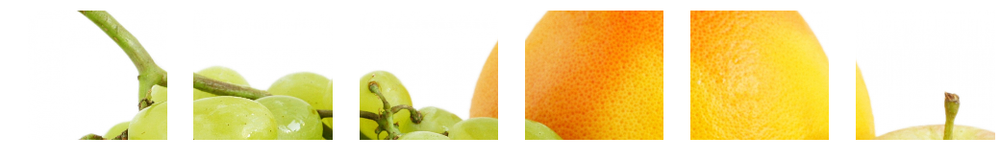

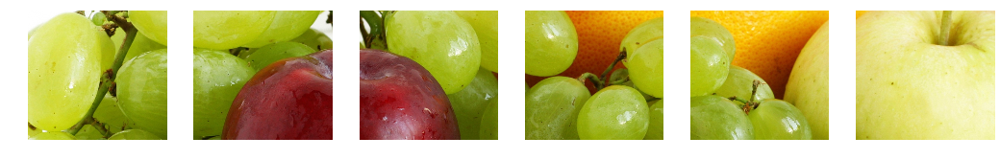

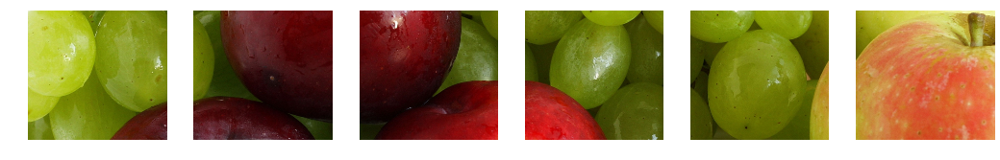

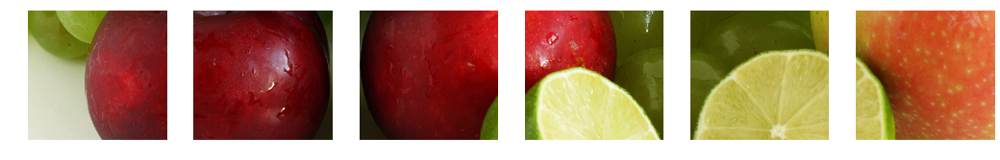

In [8]:
for i in range(4):
    plt.figure(figsize=(18, 4))
    for j in range(6):
        plt.subplot(1, 6, j + 1)
        plt.imshow(X[i * 6 + j].reshape((600, 640, 3)))
        plt.axis('off')
    plt.show()

### Само задание

Напишем несколько функций.
Первая рисует главные компоненты, вторая рисует график доли необъясненной дисперсии.
Третья функция для картинки выполняет все действия, которые написаны в условии задачи.

In [55]:
def draw_components(pca, n, m):
    plt.figure(figsize=(1, 1))
    plt.imshow(pca.mean_.reshape((n, m, 3)), cmap='gray')
    plt.axis('off')
    plt.show()

    for i, comp in enumerate(pca.components_):
        # Определим объект, если начинаем новый ряд
        if i % 10 == 0:
            plt.figure(figsize=(13, 1))
            
        plt.subplot(1, 10, i % 10 + 1)
        plt.imshow(pca.components_[i].reshape((n, m, 3)), cmap='gray')
        plt.axis('off')
        
        # Покажем объект, если ряд заканчивается
        if i % 10 == 9:
            plt.show()
    
    # Если последний ряд заполнился не полностью, его все равно надо показать
    if i % 10 != 9:
        plt.show()
        
        
def draw_residual_variance(X):
    singular_values = sp.linalg.svdvals(X)
    error = singular_values[::-1].cumsum() / singular_values.sum()
    error = error[::-1]

    plt.figure(figsize=(10, 6))
    plt.plot(range(len(error)), error, c='red', linewidth=4)
    plt.show()

        
def image_pca(image, n, m, n_components=20, draw_picture=True, draw_comp=True, draw_rv=True, visualization=True):
    # Показываем исходную картинку
    if draw_picture:
        plt.figure(figsize=(15, 7))
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    
    # Разбиение на блоки
    N, M, K = image.shape
    X = image.transpose((1, 2, 0)).reshape((M, K, N / n, n)) \
             .transpose((1, 2, 3, 0)).reshape((K, N / n, n, M / m, m)) \
             .transpose((1, 3, 2, 4, 0)).reshape((N * M / (n * m), n * m * K))
    X = X.reshape((N * M / (n * m), n * m * K))
    
    # Определение размера сжатия
    size_with_comp = (N * M * K) / ((N * M / (n * m) + n * m * K) * n_components)
    size_without_comp = (N * M * K) / (N * M / (n * m) * n_components)
    print(u'Сжатие в {} раз с учетом главных компонент'.format(round(size_with_comp, 2)))
    print(u'Сжатие в {} раз без учета главных компонент'.format(round(size_without_comp, 2)))
    
    # Применение PCA
    pca = PCA(n_components=n_components)
    Y = pca.fit_transform(X)
    X_hat = pca.inverse_transform(Y)
    
    # Разбираемся с интенсивностью цвета
    max_value = X.max()
    X_hat = X_hat * (X_hat <= max_value) + max_value * (X_hat > max_value)
    X_hat = X_hat * (X_hat >= 0)
    
    # Собираем картинку из блоков
    X_hat = X_hat.reshape((N / n, M / m, n, m, K)).transpose((1, 3, 4, 0, 2))\
                 .reshape((M / m, m, K, N)).transpose((3, 2, 0, 1))\
                 .reshape((N, K, M)).transpose((0, 2, 1))
    
    # Рисуем восстановленную картинку
    plt.figure(figsize=(15, 7))
    plt.imshow(X_hat)
    plt.axis('off')
    plt.show()
    
    # Если нужно, рисуем главные компоненты и график доли необъясненной дисперсии
    if draw_comp:
        draw_components(pca, n, m)
    if draw_rv:
        draw_residual_variance(X)
    
    # Визуализируем проекцию на первые три компоненты (третья - цвет)
    if visualization:
        pca = PCA(n_components=3)
        Y = pca.fit_transform(X)
        plt.figure(figsize=(15, 10))
        plt.scatter(Y[:, 0], Y[:, 1], c=Y[:, 2], alpha=0.1)
        plt.show()

(2400, 3840, 3)


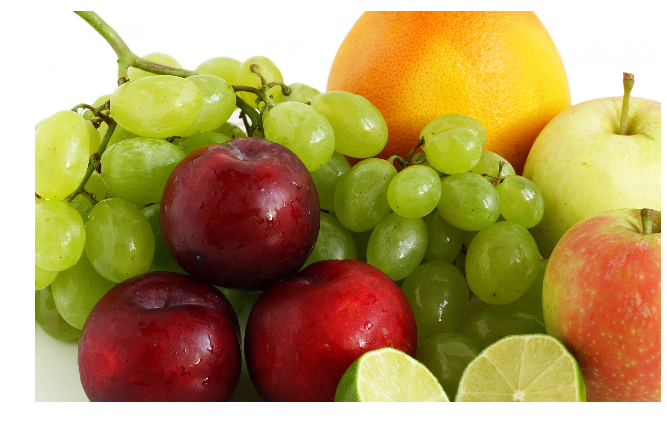

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:39: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Сжатие в 14.95 раз с учетом главных компонент
Сжатие в 15.0 раз без учета главных компонент


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:55: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


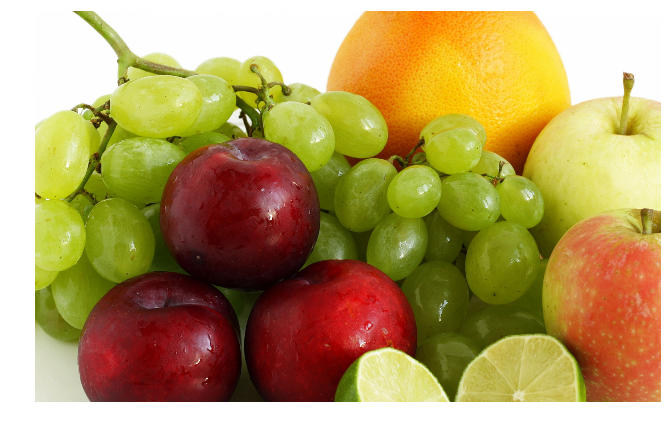

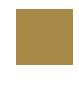

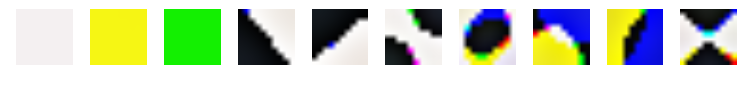

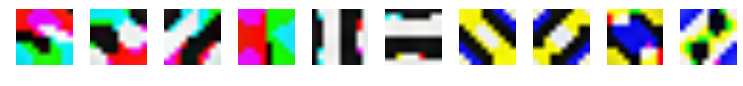

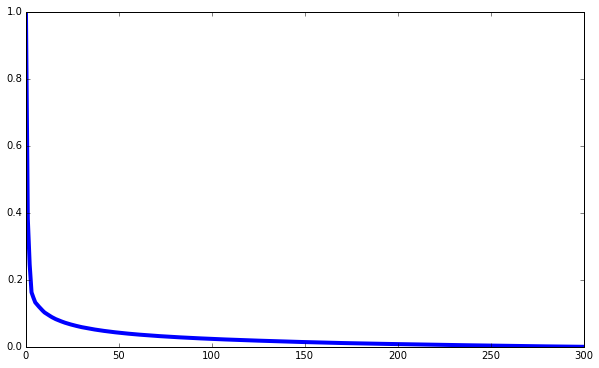

/usr/local/lib/python3.4/dist-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


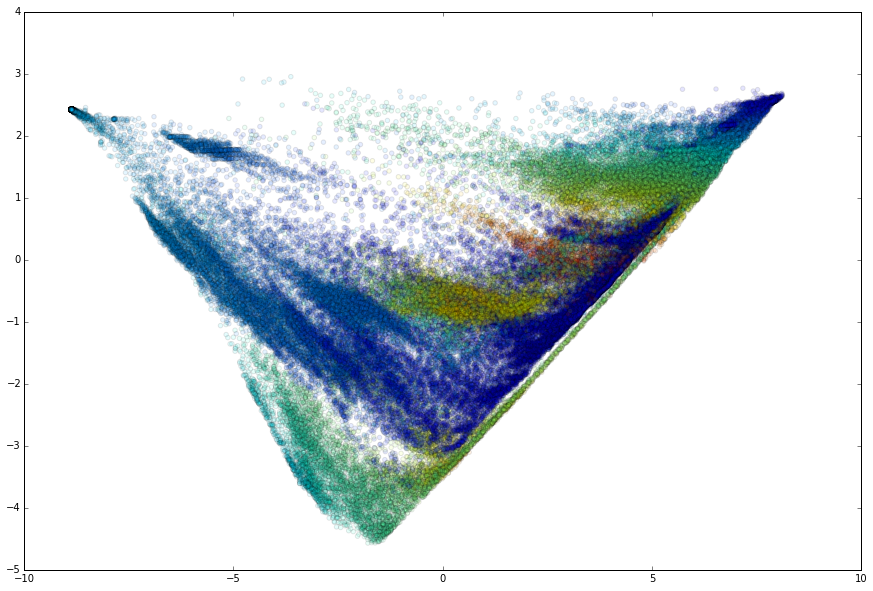

In [47]:
image = plt.imread('3840x2400.png')
print(image.shape)
image_pca(image, 10, 10)

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Число компонент 15
Сжатие в 19.94 раз с учетом главных компонент
Сжатие в 20.0 раз без учета главных компонент


/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:56: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


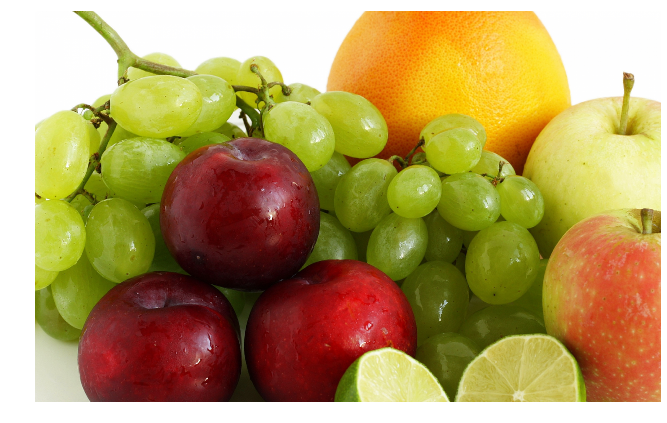

Число компонент 10
Сжатие в 29.9 раз с учетом главных компонент
Сжатие в 30.0 раз без учета главных компонент


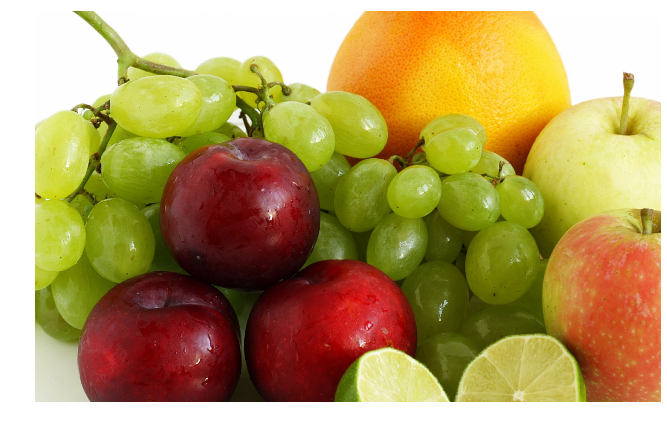

Число компонент 5
Сжатие в 59.81 раз с учетом главных компонент
Сжатие в 60.0 раз без учета главных компонент


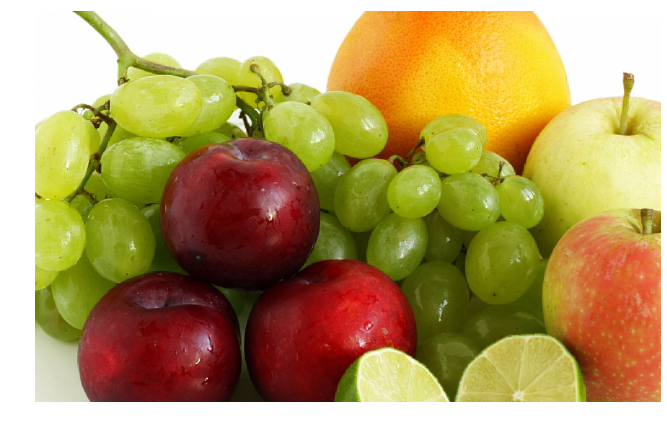

Число компонент 4
Сжатие в 74.76 раз с учетом главных компонент
Сжатие в 75.0 раз без учета главных компонент


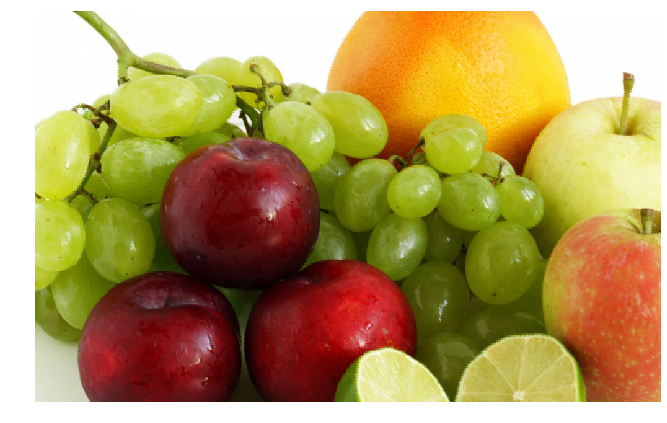

Число компонент 3
Сжатие в 99.68 раз с учетом главных компонент
Сжатие в 100.0 раз без учета главных компонент


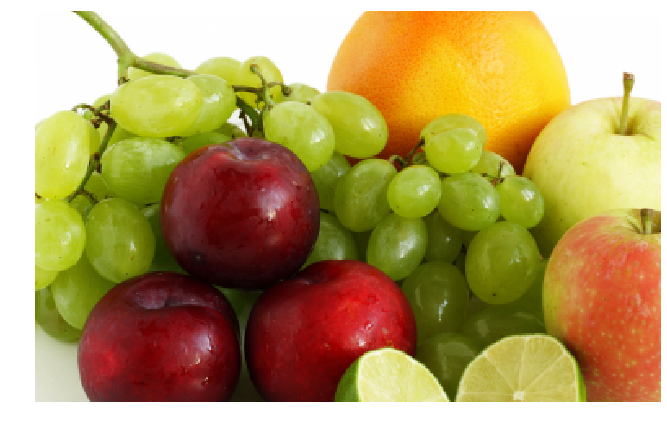

Число компонент 2
Сжатие в 149.51 раз с учетом главных компонент
Сжатие в 150.0 раз без учета главных компонент


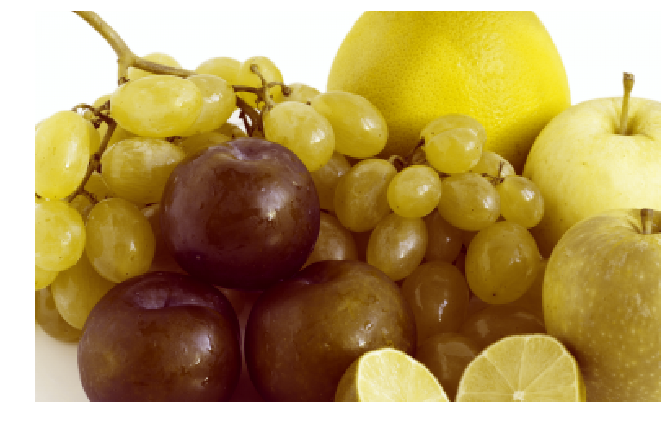

Число компонент 1
Сжатие в 299.03 раз с учетом главных компонент
Сжатие в 300.0 раз без учета главных компонент


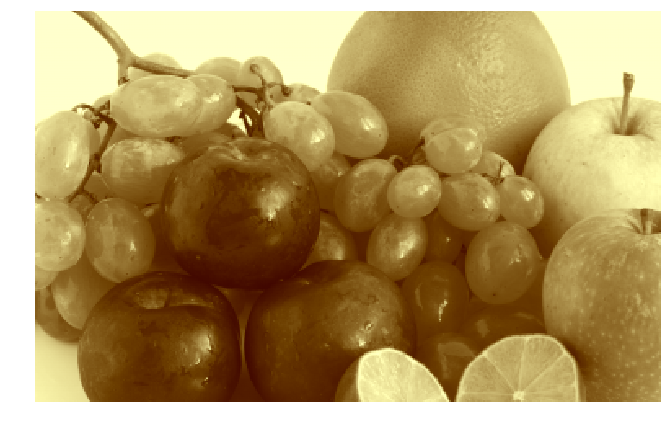

In [57]:
for n_components in [15, 10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image, 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)

(960, 1684, 3)


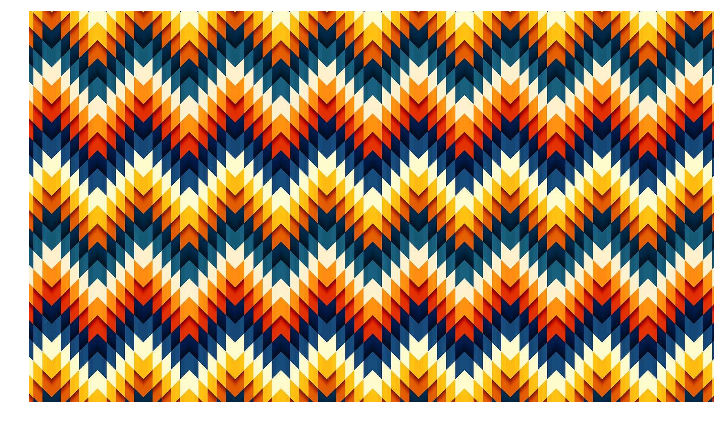

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:56: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Сжатие в 14.73 раз с учетом главных компонент
Сжатие в 15.0 раз без учета главных компонент


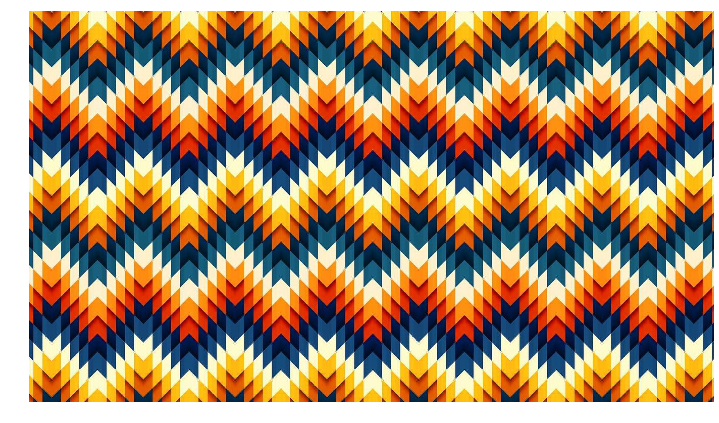

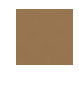

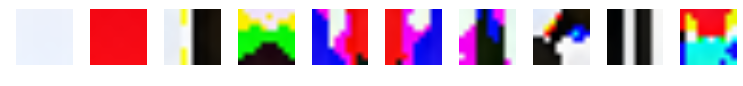

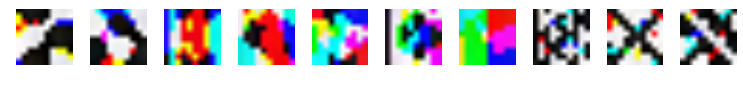

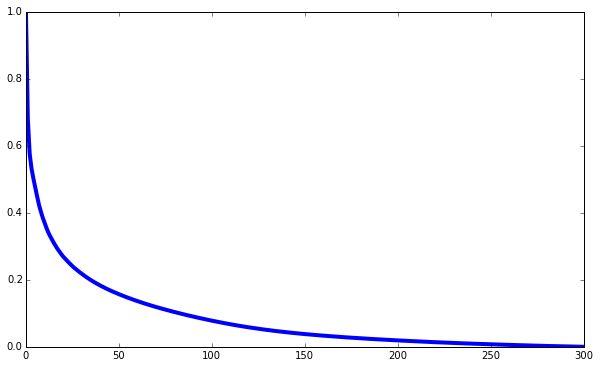

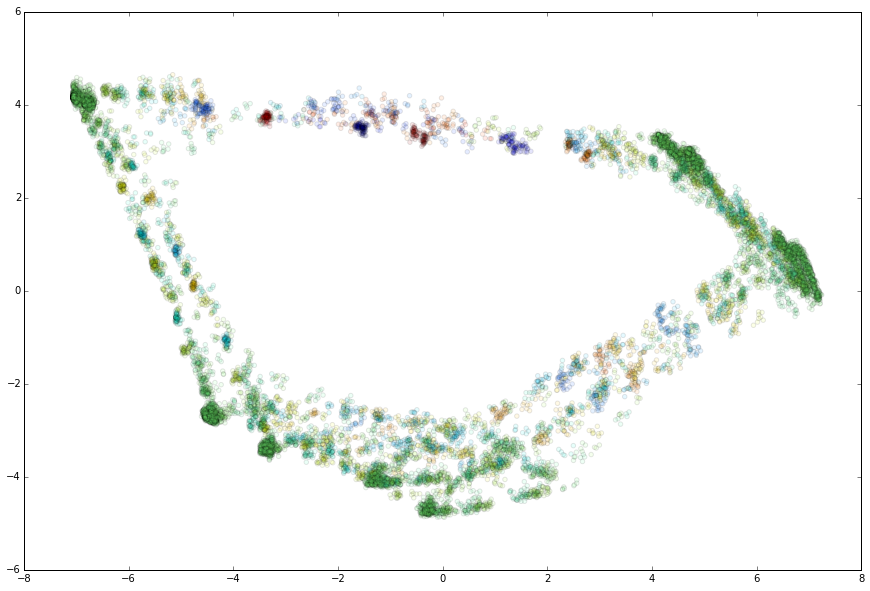

In [59]:
image = plt.imread('pattern.png')
print(image.shape)
image_pca(image[:, :1680, :], 10, 10)

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:56: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Число компонент 10
Сжатие в 29.45 раз с учетом главных компонент
Сжатие в 30.0 раз без учета главных компонент


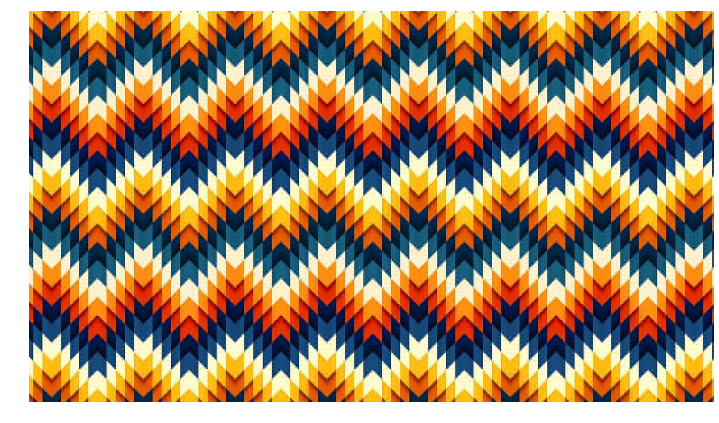

Число компонент 5
Сжатие в 58.9 раз с учетом главных компонент
Сжатие в 60.0 раз без учета главных компонент


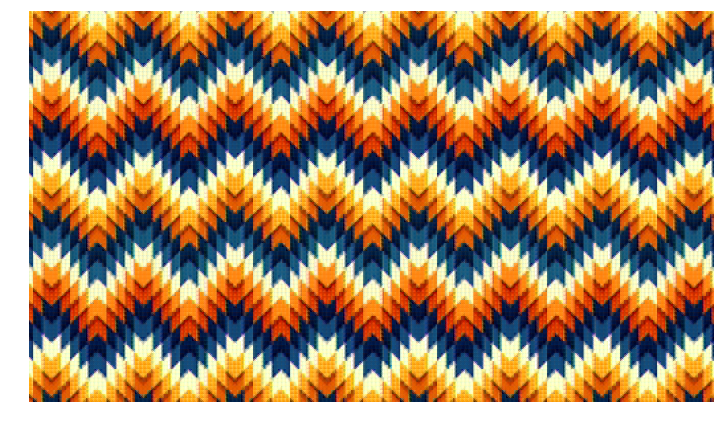

Число компонент 4
Сжатие в 73.63 раз с учетом главных компонент
Сжатие в 75.0 раз без учета главных компонент


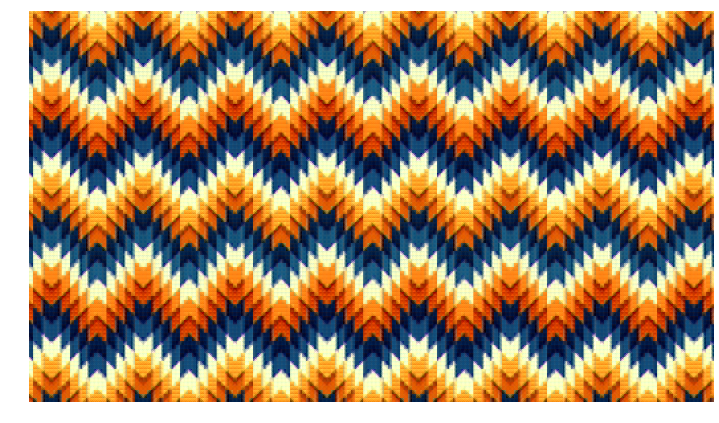

Число компонент 3
Сжатие в 98.17 раз с учетом главных компонент
Сжатие в 100.0 раз без учета главных компонент


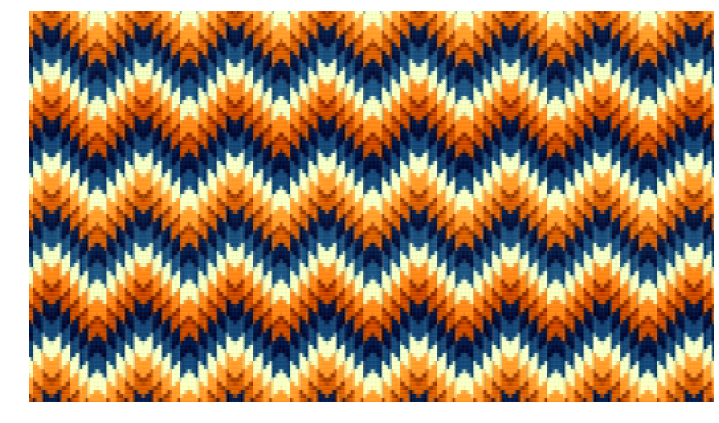

Число компонент 2
Сжатие в 147.26 раз с учетом главных компонент
Сжатие в 150.0 раз без учета главных компонент


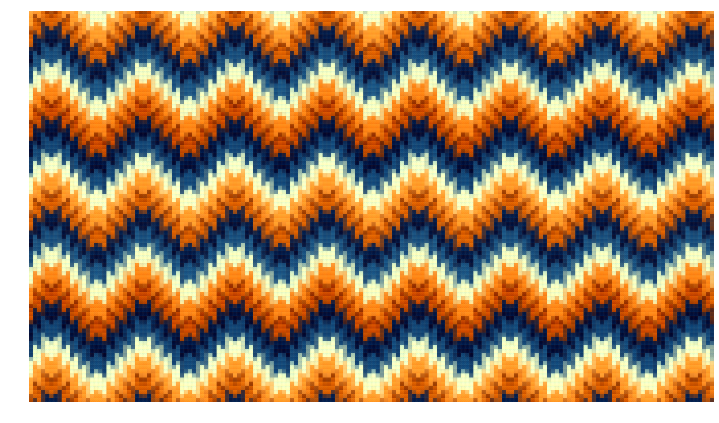

Число компонент 1
Сжатие в 294.52 раз с учетом главных компонент
Сжатие в 300.0 раз без учета главных компонент


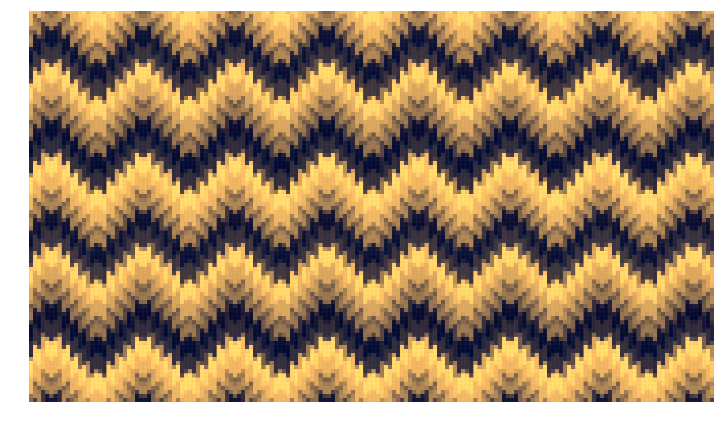

In [61]:
for n_components in [10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image[:, :1680, :], 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)

(819, 1246, 3)


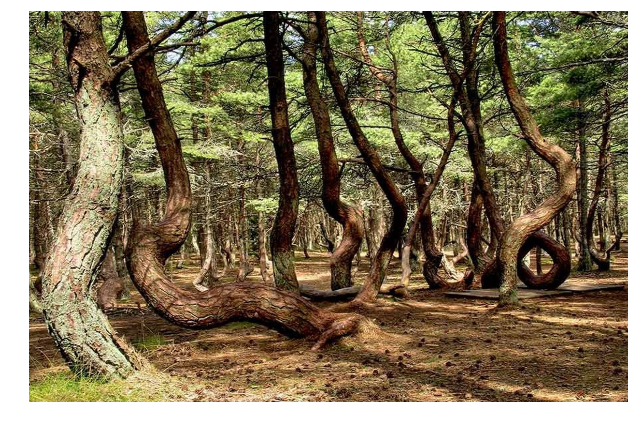

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:56: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Сжатие в 14.56 раз с учетом главных компонент
Сжатие в 15.0 раз без учета главных компонент


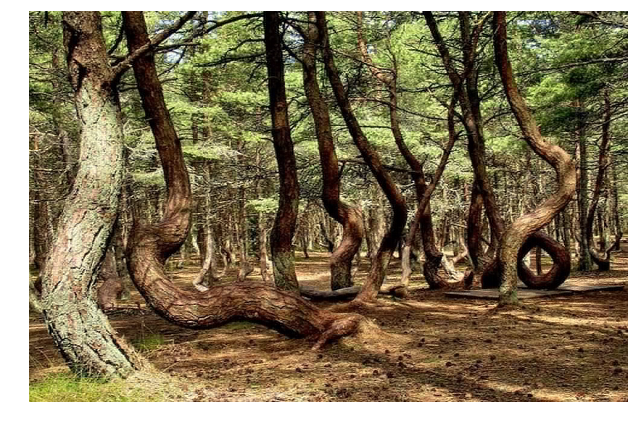

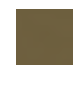

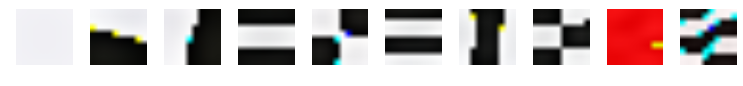

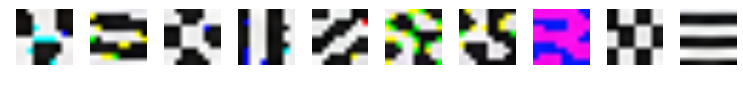

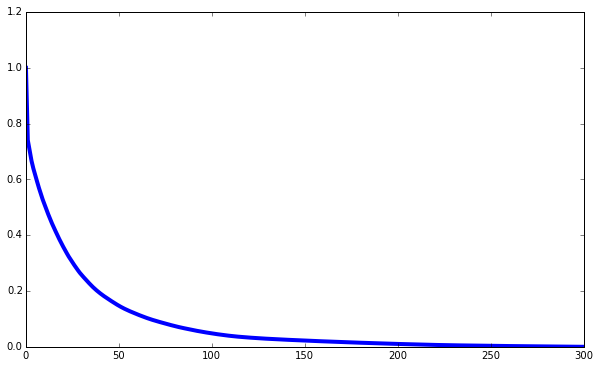

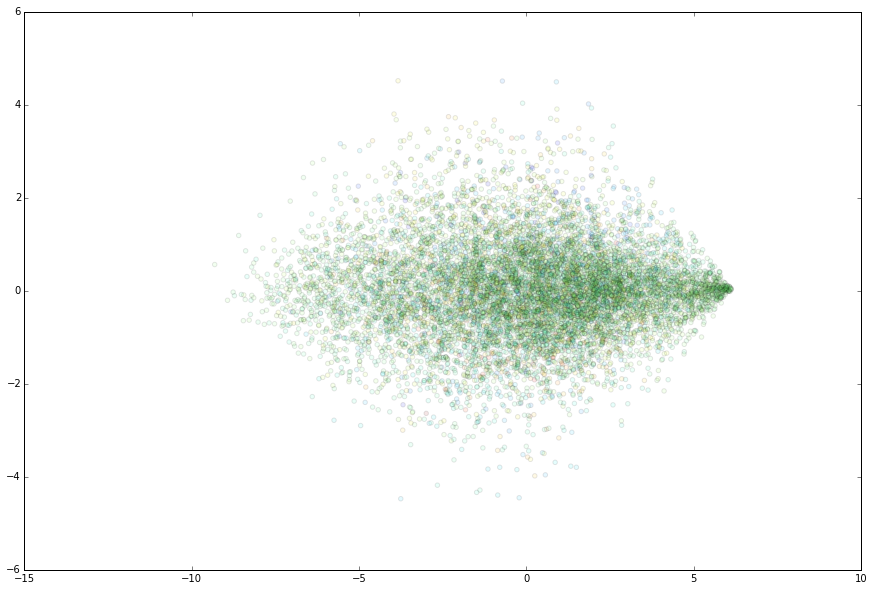

In [64]:
image = plt.imread('forest.png')
print(image.shape)
image_pca(image[:810, :1240, :], 10, 10)

/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:40: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:41: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python3.4/dist-packages/ipykernel/__main__.py:56: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Число компонент 15
Сжатие в 19.42 раз с учетом главных компонент
Сжатие в 20.0 раз без учета главных компонент


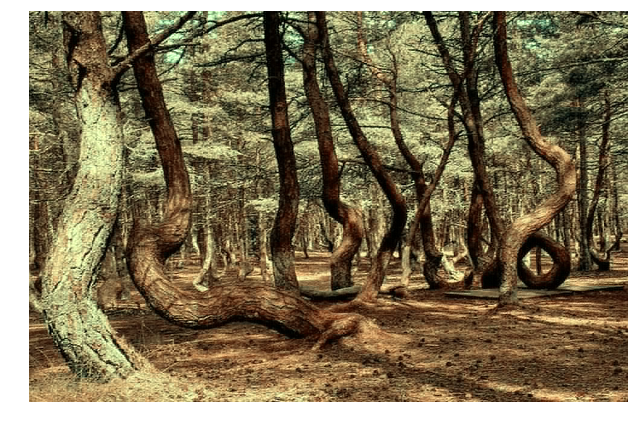

Число компонент 10
Сжатие в 29.13 раз с учетом главных компонент
Сжатие в 30.0 раз без учета главных компонент


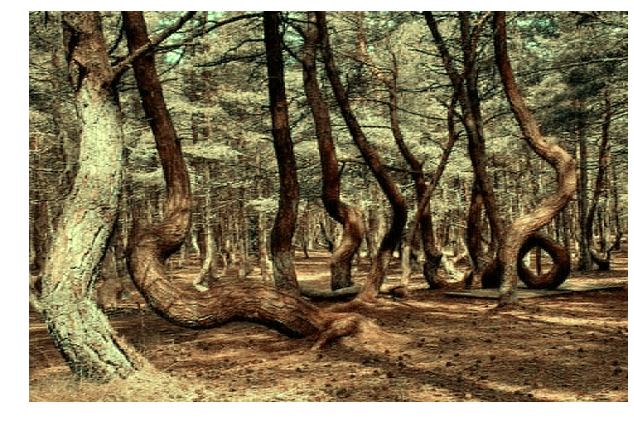

Число компонент 5
Сжатие в 58.26 раз с учетом главных компонент
Сжатие в 60.0 раз без учета главных компонент


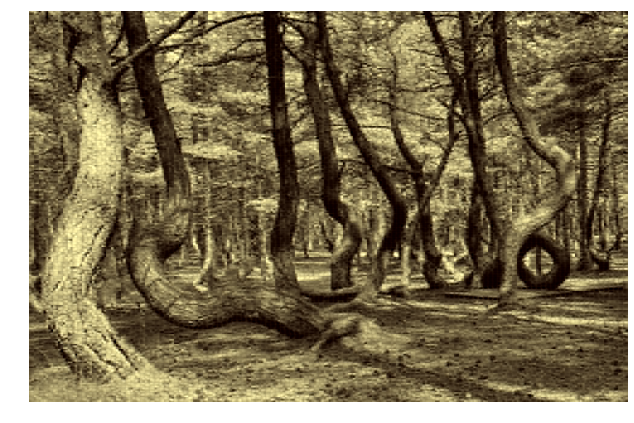

Число компонент 4
Сжатие в 72.82 раз с учетом главных компонент
Сжатие в 75.0 раз без учета главных компонент


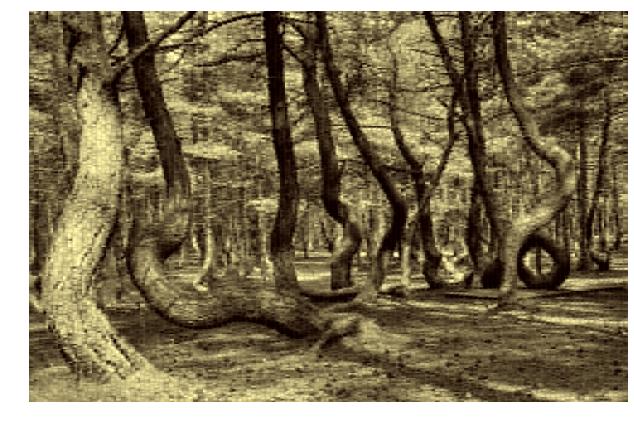

Число компонент 3
Сжатие в 97.1 раз с учетом главных компонент
Сжатие в 100.0 раз без учета главных компонент


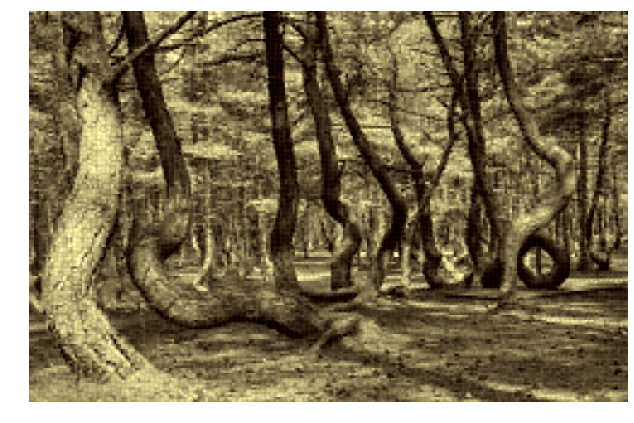

Число компонент 2
Сжатие в 145.65 раз с учетом главных компонент
Сжатие в 150.0 раз без учета главных компонент


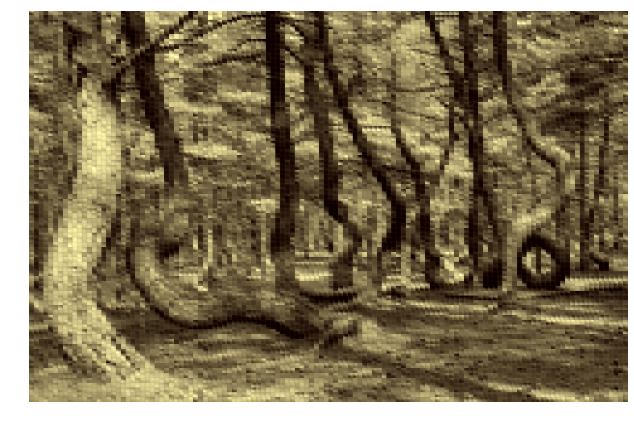

Число компонент 1
Сжатие в 291.3 раз с учетом главных компонент
Сжатие в 300.0 раз без учета главных компонент


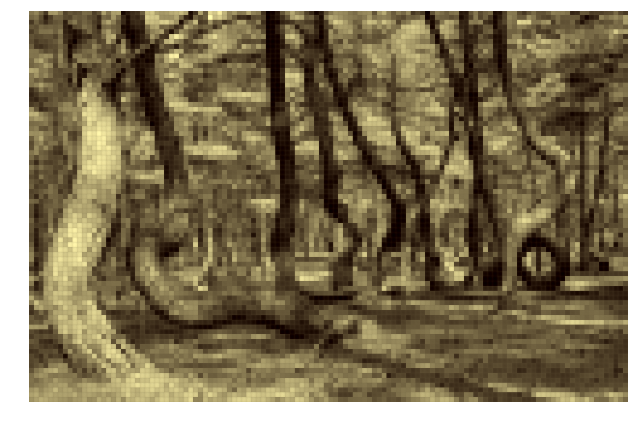

In [66]:
for n_components in [15, 10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image[:810, :1240, :], 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)